In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')

# Configurar para exibir gráficos no Jupyter
%matplotlib inline

# Configurar estilo
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# Carregar dados
print("Carregando dados...")
noticias_class = pd.read_csv('noticias_classificadas_garch.csv')
# Manter apenas as colunas nas posições 0, 2, 3, 4, 5, 6, 7
noticias_class = noticias_class.iloc[:, [0, 2, 3, 4, 5, 6, 7]]
noticias_orig = pd.read_csv('../dataset/noticias_cafe.csv')
series_df = pd.read_csv('../dataset/M5_ICF$.csv', sep='\t')

# Preparar dados
noticias_orig['data_hora'] = pd.to_datetime(noticias_orig['data_hora'], format='%d/%m/%Y %H:%M')
series_df['Time'] = pd.to_datetime(series_df['Time'], format='%Y.%m.%d %H:%M:%S')
series_df = series_df.sort_values('Time').reset_index(drop=True)

# Juntar informações de data nas notícias classificadas
noticias_full = pd.concat([noticias_orig[['data_hora']], noticias_class], axis=1)

print(f"✓ Total de notícias classificadas: {len(noticias_full)}")
print(f"✓ Período das notícias: {noticias_full['data_hora'].min()} até {noticias_full['data_hora'].max()}")
print(f"✓ Período da série: {series_df['Time'].min()} até {series_df['Time'].max()}")
print("\nDados carregados com sucesso!")

Carregando dados...
✓ Total de notícias classificadas: 6246
✓ Período das notícias: 2021-01-04 08:51:00 até 2026-01-02 10:21:00
✓ Período da série: 2021-01-04 09:00:00 até 2026-01-02 15:55:00

Dados carregados com sucesso!


Total de trimestres encontrados: 21
Trimestres: ['2021Q1', '2021Q2', '2021Q3', '2021Q4', '2022Q1', '2022Q2', '2022Q3', '2022Q4', '2023Q1', '2023Q2', '2023Q3', '2023Q4', '2024Q1', '2024Q2', '2024Q3', '2024Q4', '2025Q1', '2025Q2', '2025Q3', '2025Q4', '2026Q1']


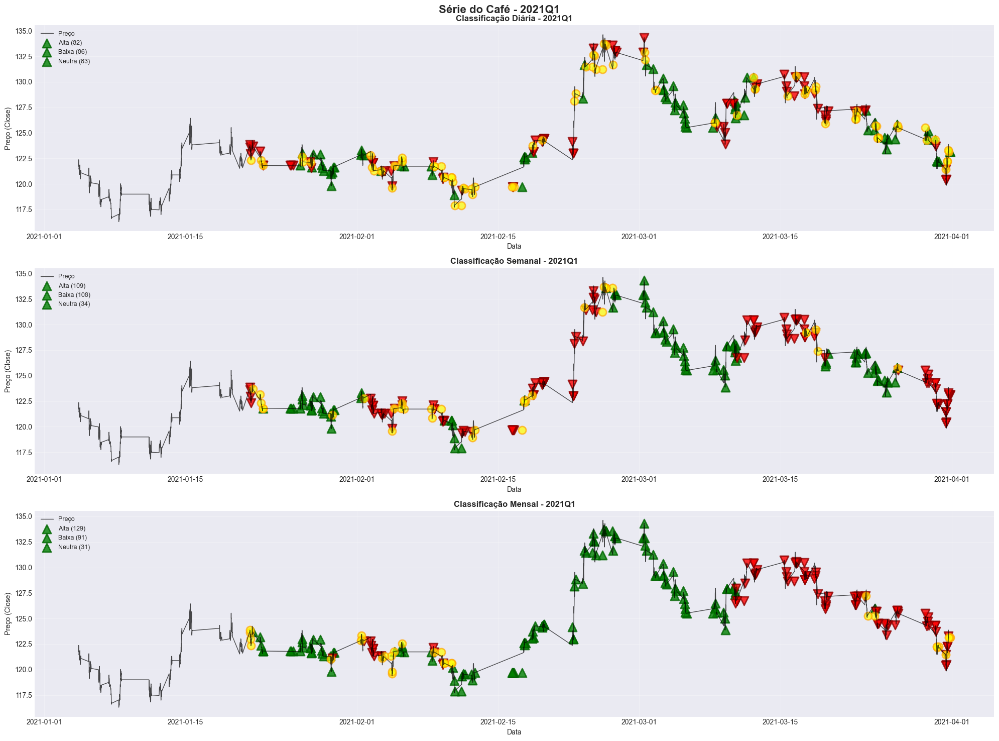

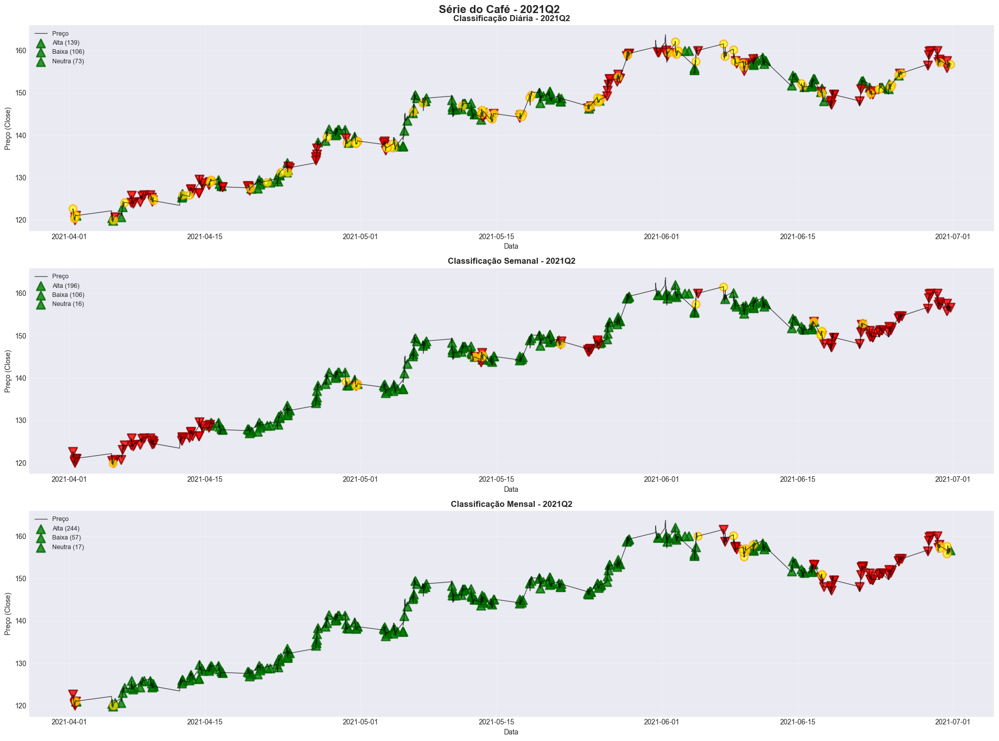

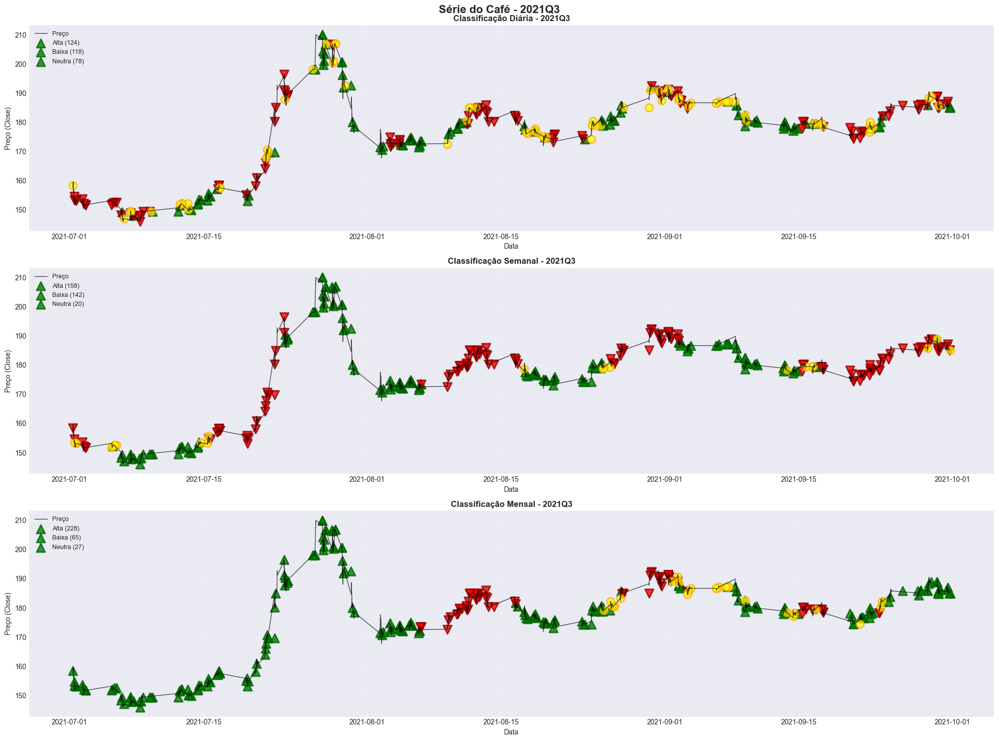

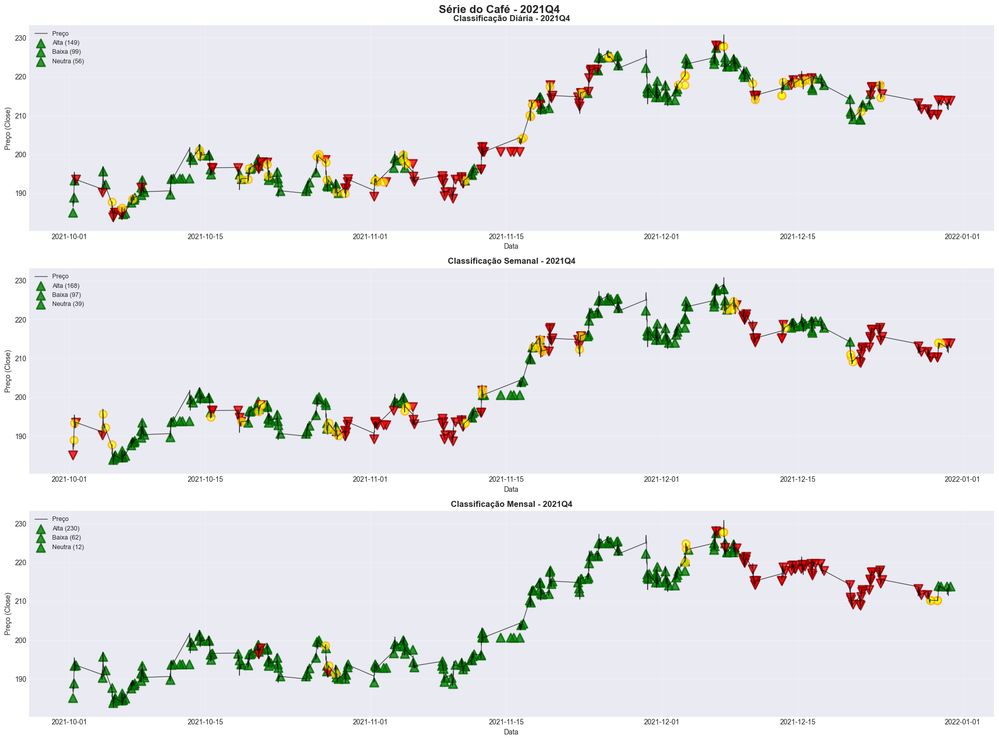

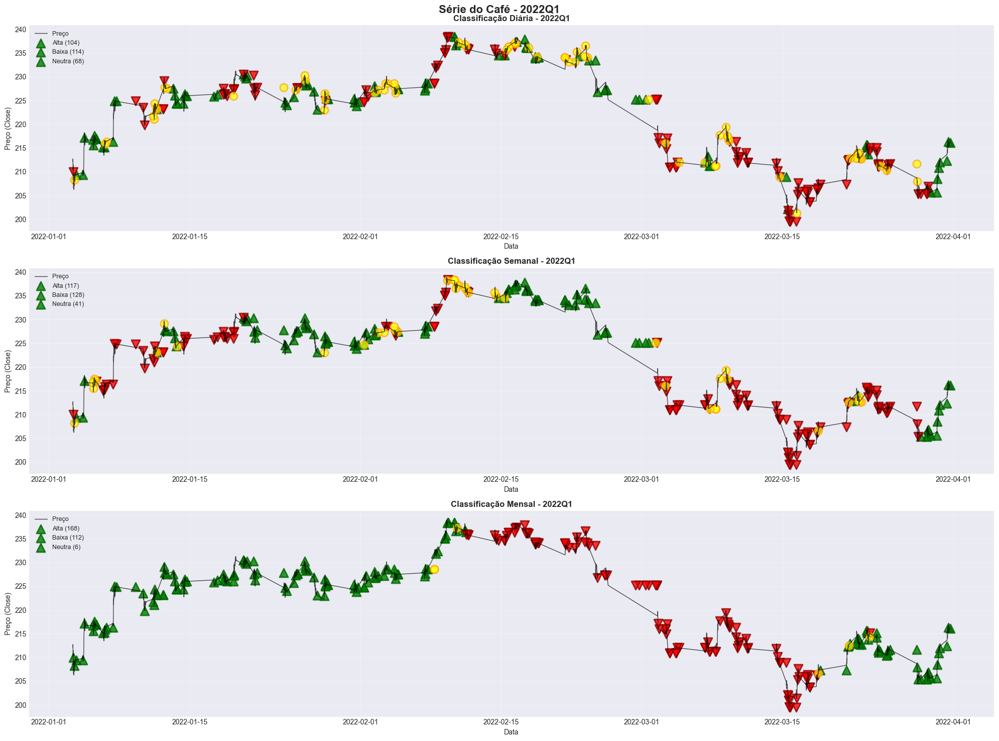

...

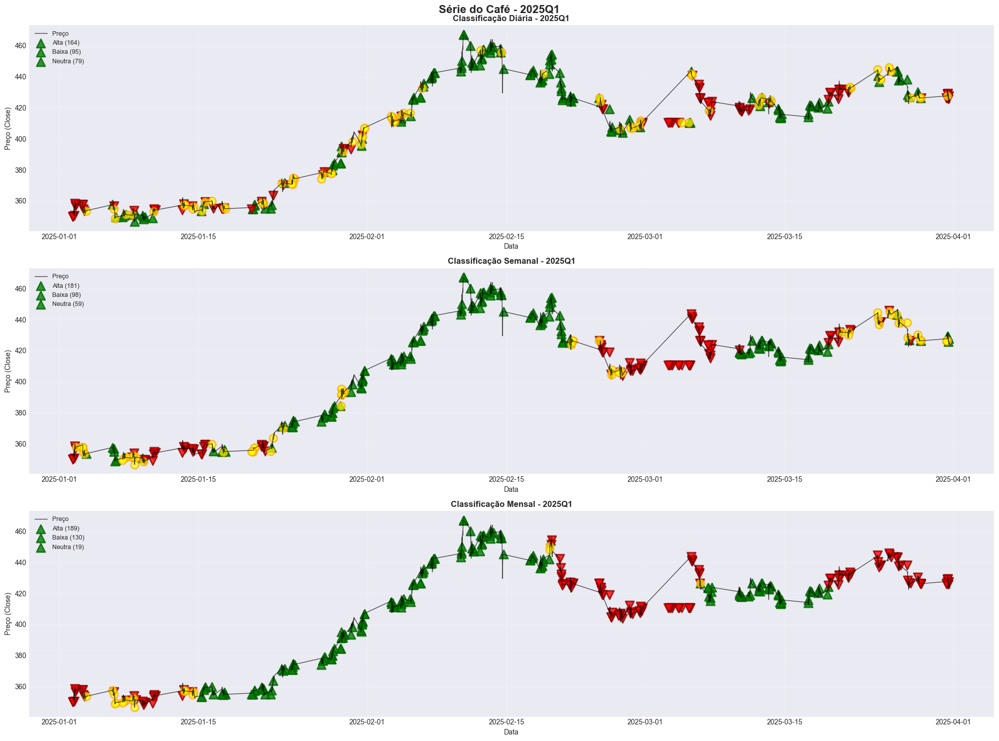

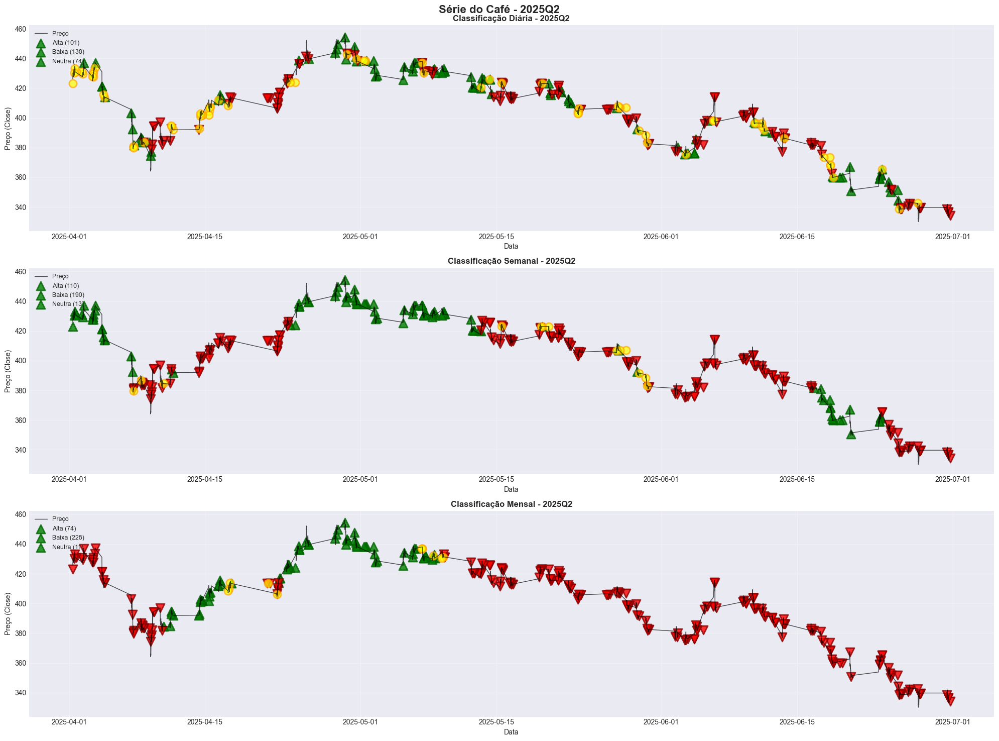

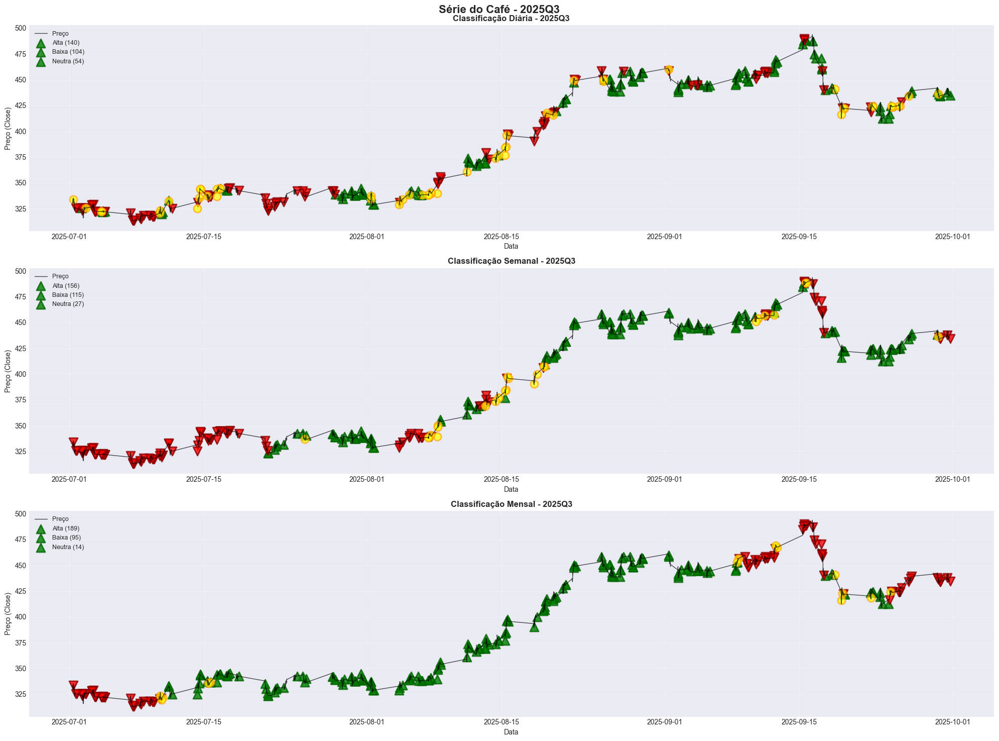

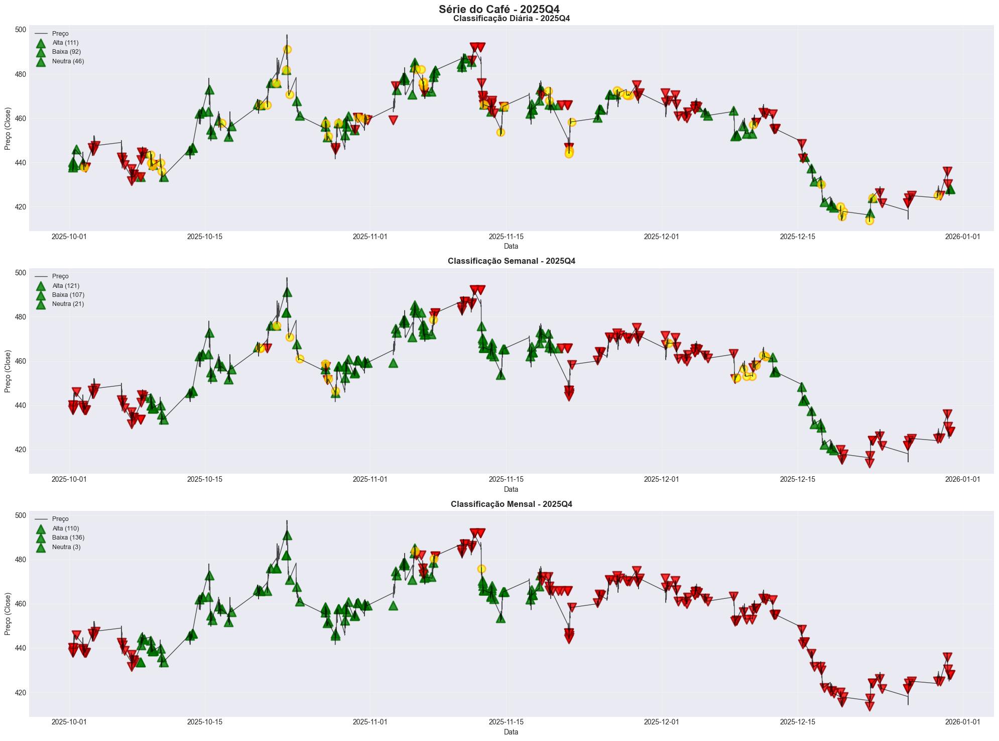

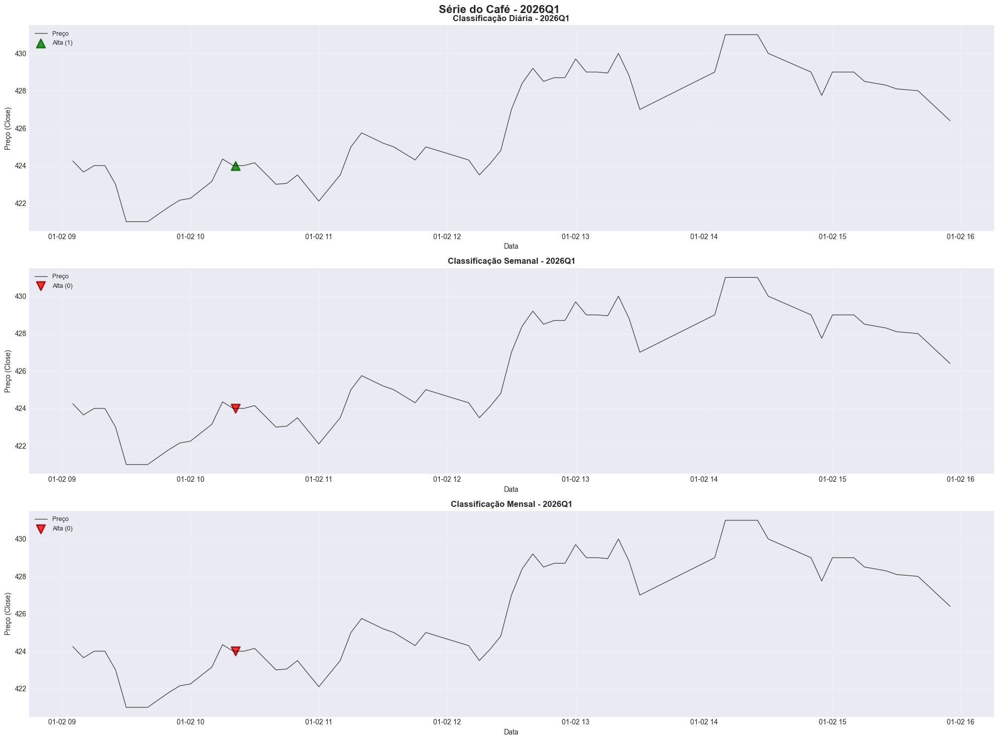


✓ Todos os gráficos trimestrais foram gerados!


In [7]:
# ============================================================================
# GRÁFICO 1: SÉRIE TEMPORAL COM MARCADORES DE NOTÍCIAS (POR TRIMESTRE)
# ============================================================================

def plot_serie_com_noticias_trimestral():
    # Definir trimestres
    series_df['trimestre'] = series_df['Time'].dt.to_period('Q')
    noticias_full['trimestre'] = noticias_full['data_hora'].dt.to_period('Q')
    
    trimestres = sorted(series_df['trimestre'].unique())
    
    print(f"Total de trimestres encontrados: {len(trimestres)}")
    print(f"Trimestres: {[str(t) for t in trimestres]}")
    
    janelas = [
        ('dia', 'neutro_dia', 'Classificação Diária'),
        ('semana', 'neutro_semana', 'Classificação Semanal'),
        ('mes', 'neutro_mes', 'Classificação Mensal')
    ]
    
    # Função para pegar preço mais próximo
    def get_price_at_time(dt):
        mask = series_df['Time'] <= dt
        if mask.sum() == 0:
            return None
        return series_df[mask].iloc[-1]['Close']
    
    # Para cada trimestre, criar uma figura
    for trimestre in trimestres:
        fig, axes = plt.subplots(3, 1, figsize=(20, 15))
        fig.suptitle(f'Série do Café - {trimestre}', fontsize=16, fontweight='bold')
        
        # Filtrar dados do trimestre
        series_trim = series_df[series_df['trimestre'] == trimestre]
        noticias_trim = noticias_full[noticias_full['trimestre'] == trimestre]
        
        if len(noticias_trim) == 0:
            print(f"⚠ Sem notícias no trimestre {trimestre}, pulando...")
            plt.close(fig)
            continue
        
        for idx, (col_classe, col_neutro, titulo) in enumerate(janelas):
            ax = axes[idx]
            
            # Plotar série de preços
            ax.plot(series_trim['Time'], series_trim['Close'], 
                    color='black', linewidth=1, alpha=0.7, label='Preço Café')
            
            # Separar notícias por classificação
            noticias_alta = noticias_trim[(noticias_trim[col_classe] == 1) & (noticias_trim[col_neutro] == 0)]
            noticias_baixa = noticias_trim[(noticias_trim[col_classe] == 0) & (noticias_trim[col_neutro] == 0)]
            noticias_neutra = noticias_trim[noticias_trim[col_neutro] == 1]
            
            # Plotar marcadores
            for _, row in noticias_alta.iterrows():
                price = get_price_at_time(row['data_hora'])
                if price:
                    ax.scatter(row['data_hora'], price, color='green', s=150, 
                              marker='^', alpha=0.8, edgecolors='darkgreen', linewidth=2)
            
            for _, row in noticias_baixa.iterrows():
                price = get_price_at_time(row['data_hora'])
                if price:
                    ax.scatter(row['data_hora'], price, color='red', s=150, 
                              marker='v', alpha=0.8, edgecolors='darkred', linewidth=2)
            
            for _, row in noticias_neutra.iterrows():
                price = get_price_at_time(row['data_hora'])
                if price:
                    ax.scatter(row['data_hora'], price, color='yellow', s=120, 
                              marker='o', alpha=0.7, edgecolors='orange', linewidth=2)
            
            ax.set_title(f'{titulo} - {trimestre}', fontsize=12, fontweight='bold')
            ax.set_xlabel('Data', fontsize=10)
            ax.set_ylabel('Preço (Close)', fontsize=10)
            ax.grid(True, alpha=0.3)
            ax.legend(['Preço', 
                       f'Alta ({len(noticias_alta)})', 
                       f'Baixa ({len(noticias_baixa)})', 
                       f'Neutra ({len(noticias_neutra)})'], 
                      loc='upper left', fontsize=9)
        
        plt.tight_layout()
        #filename = f'grafico1_serie_trimestre_{str(trimestre).replace("/", "_")}.png'
        #plt.savefig(filename, dpi=300, bbox_inches='tight')
        plt.show()
        #print(f"✓ Gráfico salvo: {filename}")

# Executar
plot_serie_com_noticias_trimestral()
print("\n✓ Todos os gráficos trimestrais foram gerados!")

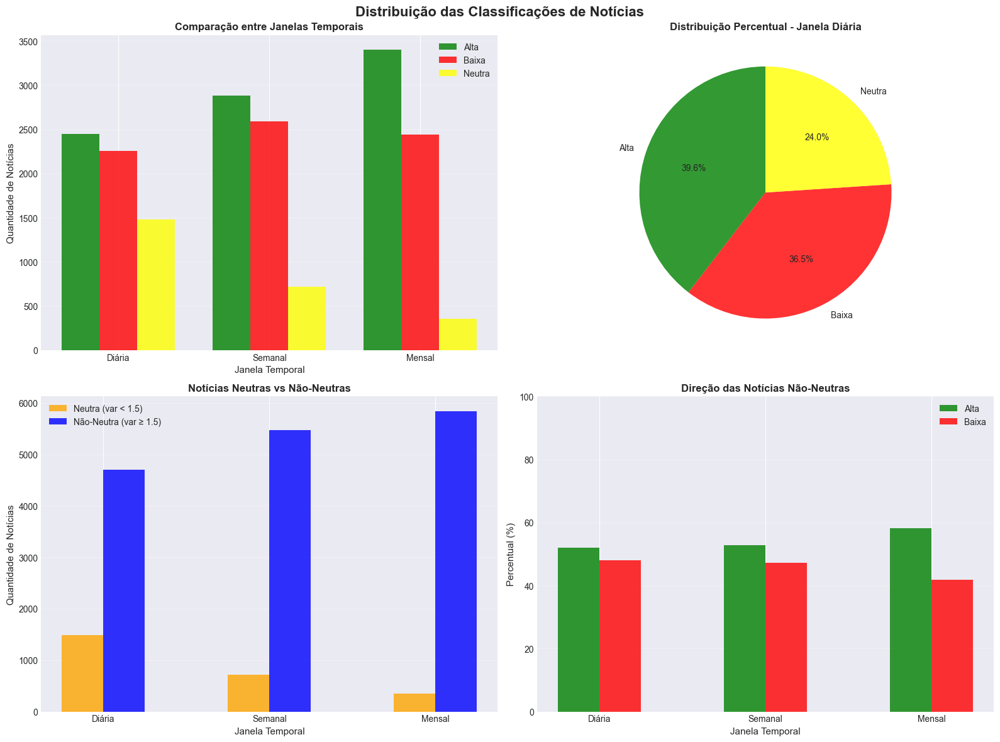

In [8]:
# ============================================================================
# GRÁFICO 2: DISTRIBUIÇÃO DAS CLASSIFICAÇÕES
# ============================================================================

def plot_distribuicao_classificacoes():
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Distribuição das Classificações de Notícias', fontsize=16, fontweight='bold')
    
    janelas = [
        ('dia', 'neutro_dia', 'Diária'),
        ('semana', 'neutro_semana', 'Semanal'),
        ('mes', 'neutro_mes', 'Mensal')
    ]
    
    # Gráfico 1: Comparação de Alta/Baixa/Neutra para cada janela
    ax1 = axes[0, 0]
    dados_barras = []
    labels = []
    
    for col_classe, col_neutro, nome in janelas:
        alta = ((noticias_full[col_classe] == 1) & (noticias_full[col_neutro] == 0)).sum()
        baixa = ((noticias_full[col_classe] == 0) & (noticias_full[col_neutro] == 0)).sum()
        neutra = (noticias_full[col_neutro] == 1).sum()
        dados_barras.append([alta, baixa, neutra])
        labels.append(nome)
    
    dados_barras = np.array(dados_barras)
    x = np.arange(len(labels))
    width = 0.25
    
    ax1.bar(x - width, dados_barras[:, 0], width, label='Alta', color='green', alpha=0.8)
    ax1.bar(x, dados_barras[:, 1], width, label='Baixa', color='red', alpha=0.8)
    ax1.bar(x + width, dados_barras[:, 2], width, label='Neutra', color='yellow', alpha=0.8)
    
    ax1.set_xlabel('Janela Temporal', fontsize=11)
    ax1.set_ylabel('Quantidade de Notícias', fontsize=11)
    ax1.set_title('Comparação entre Janelas Temporais', fontsize=12, fontweight='bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(labels)
    ax1.legend()
    ax1.grid(axis='y', alpha=0.3)
    
    # Gráfico 2: Percentual para janela diária
    ax2 = axes[0, 1]
    alta = ((noticias_full['dia'] == 1) & (noticias_full['neutro_dia'] == 0)).sum()
    baixa = ((noticias_full['dia'] == 0) & (noticias_full['neutro_dia'] == 0)).sum()
    neutra = (noticias_full['neutro_dia'] == 1).sum()
    total = alta + baixa + neutra
    
    percentuais = [alta/total*100, baixa/total*100, neutra/total*100]
    colors = ['green', 'red', 'yellow']
    
    # CORREÇÃO: Remover alpha do pie
    wedges, texts, autotexts = ax2.pie(percentuais, labels=['Alta', 'Baixa', 'Neutra'],
                                         autopct='%1.1f%%', startangle=90,
                                         colors=colors)
    
    # Aplicar transparência nos wedges manualmente
    for wedge in wedges:
        wedge.set_alpha(0.8)
    
    ax2.set_title(f'Distribuição Percentual - Janela Diária', fontsize=12, fontweight='bold')
    
    # Gráfico 3: Proporção Neutra vs Não-Neutra
    ax3 = axes[1, 0]
    dados_neutro = []
    
    for col_classe, col_neutro, nome in janelas:
        neutra = (noticias_full[col_neutro] == 1).sum()
        nao_neutra = (noticias_full[col_neutro] == 0).sum()
        dados_neutro.append([neutra, nao_neutra])
        
    dados_neutro = np.array(dados_neutro)
    
    ax3.bar(x - width/2, dados_neutro[:, 0], width, label='Neutra (var < 1.5)', color='orange', alpha=0.8)
    ax3.bar(x + width/2, dados_neutro[:, 1], width, label='Não-Neutra (var ≥ 1.5)', color='blue', alpha=0.8)
    
    ax3.set_xlabel('Janela Temporal', fontsize=11)
    ax3.set_ylabel('Quantidade de Notícias', fontsize=11)
    ax3.set_title('Notícias Neutras vs Não-Neutras', fontsize=12, fontweight='bold')
    ax3.set_xticks(x)
    ax3.set_xticklabels(labels)
    ax3.legend()
    ax3.grid(axis='y', alpha=0.3)
    
    # Gráfico 4: Proporção Alta/Baixa (excluindo neutras)
    ax4 = axes[1, 1]
    dados_direcao = []
    
    for col_classe, col_neutro, nome in janelas:
        alta = ((noticias_full[col_classe] == 1) & (noticias_full[col_neutro] == 0)).sum()
        baixa = ((noticias_full[col_classe] == 0) & (noticias_full[col_neutro] == 0)).sum()
        total_nao_neutro = alta + baixa
        
        if total_nao_neutro > 0:
            dados_direcao.append([alta/total_nao_neutro*100, baixa/total_nao_neutro*100])
        else:
            dados_direcao.append([0, 0])
    
    dados_direcao = np.array(dados_direcao)
    
    ax4.bar(x - width/2, dados_direcao[:, 0], width, label='Alta', color='green', alpha=0.8)
    ax4.bar(x + width/2, dados_direcao[:, 1], width, label='Baixa', color='red', alpha=0.8)
    
    ax4.set_xlabel('Janela Temporal', fontsize=11)
    ax4.set_ylabel('Percentual (%)', fontsize=11)
    ax4.set_title('Direção das Notícias Não-Neutras', fontsize=12, fontweight='bold')
    ax4.set_xticks(x)
    ax4.set_xticklabels(labels)
    ax4.legend()
    ax4.grid(axis='y', alpha=0.3)
    ax4.set_ylim([0, 100])
    
    plt.tight_layout()
    #plt.savefig('grafico2_distribuicao_classificacoes.png', dpi=300, bbox_inches='tight')
    plt.show()
    #print("✓ Gráfico 2 salvo: grafico2_distribuicao_classificacoes.png")

# Executar
plot_distribuicao_classificacoes()

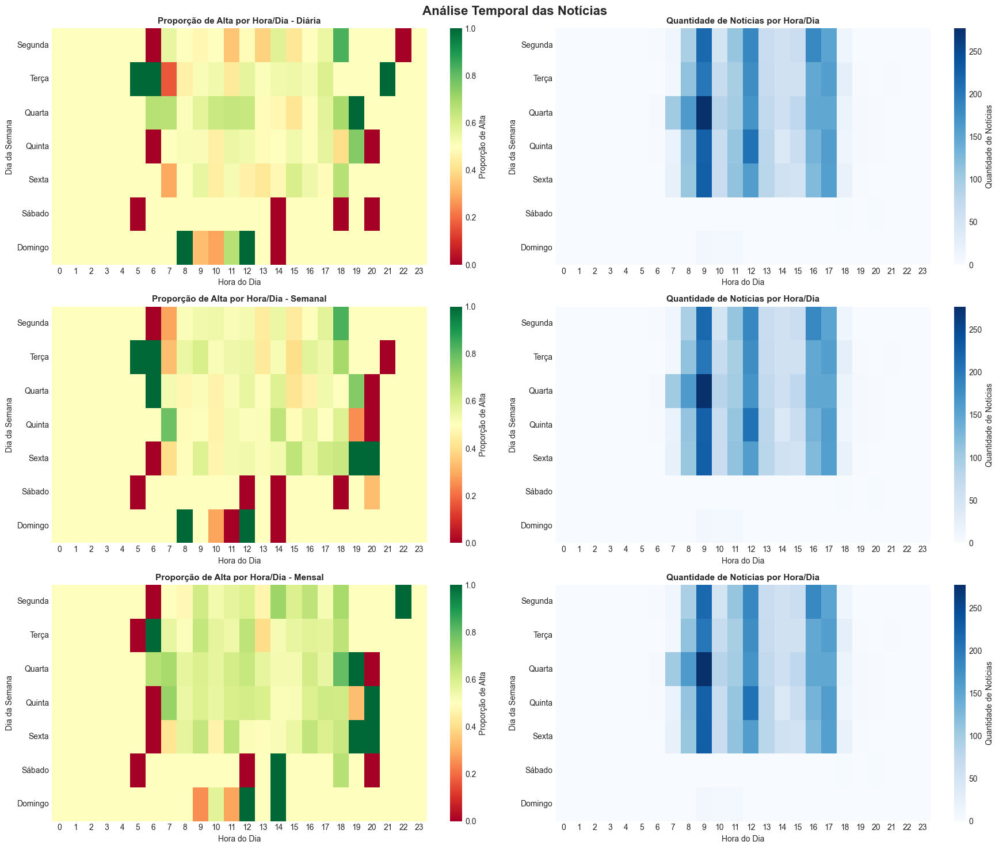

In [9]:
# ============================================================================
# GRÁFICO 3: HEATMAP DE CORRELAÇÃO TEMPORAL
# ============================================================================

def plot_heatmap_temporal():
    fig, axes = plt.subplots(3, 2, figsize=(18, 15))
    fig.suptitle('Análise Temporal das Notícias', fontsize=16, fontweight='bold')
    
    # Adicionar informações temporais
    noticias_full['hora'] = noticias_full['data_hora'].dt.hour
    noticias_full['dia_semana'] = noticias_full['data_hora'].dt.dayofweek
    noticias_full['dia_mes'] = noticias_full['data_hora'].dt.day
    
    dias_semana = ['Segunda', 'Terça', 'Quarta', 'Quinta', 'Sexta', 'Sábado', 'Domingo']
    
    janelas = [
        ('dia', 'neutro_dia', 'Diária'),
        ('semana', 'neutro_semana', 'Semanal'),
        ('mes', 'neutro_mes', 'Mensal')
    ]
    
    for idx, (col_classe, col_neutro, nome) in enumerate(janelas):
        # Heatmap: Hora vs Dia da Semana - Proporção de Alta
        ax1 = axes[idx, 0]
        
        # Criar matriz de proporção de alta
        matriz_alta = np.zeros((7, 24))
        matriz_contagem = np.zeros((7, 24))
        
        for _, row in noticias_full[noticias_full[col_neutro] == 0].iterrows():
            dia = int(row['dia_semana'])
            hora = int(row['hora'])
            matriz_contagem[dia, hora] += 1
            if row[col_classe] == 1:
                matriz_alta[dia, hora] += 1
        
        # Calcular proporção (evitar divisão por zero)
        with np.errstate(divide='ignore', invalid='ignore'):
            matriz_prop = np.divide(matriz_alta, matriz_contagem)
            matriz_prop[np.isnan(matriz_prop)] = 0.5  # Cinza para sem dados
        
        sns.heatmap(matriz_prop, ax=ax1, cmap='RdYlGn', center=0.5, 
                    vmin=0, vmax=1, cbar_kws={'label': 'Proporção de Alta'},
                    xticklabels=range(24), yticklabels=dias_semana)
        
        ax1.set_title(f'Proporção de Alta por Hora/Dia - {nome}', fontsize=11, fontweight='bold')
        ax1.set_xlabel('Hora do Dia', fontsize=10)
        ax1.set_ylabel('Dia da Semana', fontsize=10)
        
        # Heatmap: Contagem de notícias
        ax2 = axes[idx, 1]
        
        matriz_total = np.zeros((7, 24))
        for _, row in noticias_full.iterrows():
            dia = int(row['dia_semana'])
            hora = int(row['hora'])
            matriz_total[dia, hora] += 1
        
        sns.heatmap(matriz_total, ax=ax2, cmap='Blues', 
                    cbar_kws={'label': 'Quantidade de Notícias'},
                    xticklabels=range(24), yticklabels=dias_semana)
        
        ax2.set_title(f'Quantidade de Notícias por Hora/Dia', fontsize=11, fontweight='bold')
        ax2.set_xlabel('Hora do Dia', fontsize=10)
        ax2.set_ylabel('Dia da Semana', fontsize=10)
    
    plt.tight_layout()
    #plt.savefig('grafico3_heatmap_temporal.png', dpi=300, bbox_inches='tight')
    plt.show()
    #print("✓ Gráfico 3 salvo: grafico3_heatmap_temporal.png")

# Executar
plot_heatmap_temporal()

Calculando variações de preço...


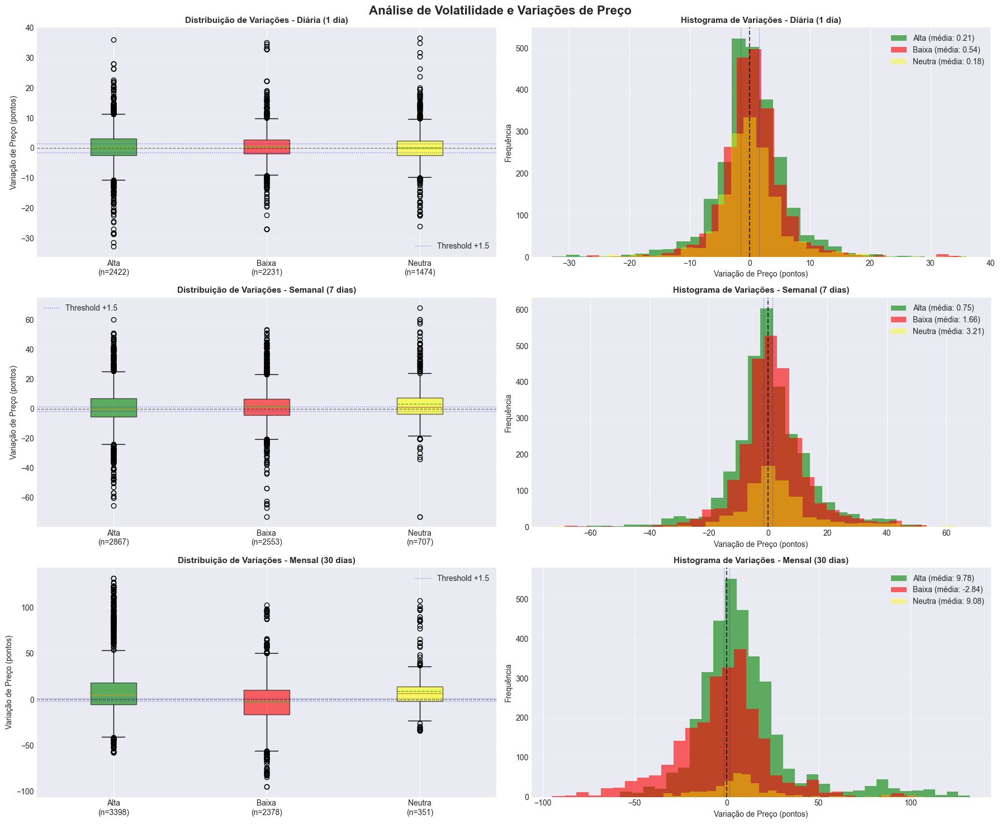

In [10]:
# ============================================================================
# GRÁFICO 4: ANÁLISE DE VOLATILIDADE
# ============================================================================

def plot_analise_volatilidade():
    fig, axes = plt.subplots(3, 2, figsize=(18, 15))
    fig.suptitle('Análise de Volatilidade e Variações de Preço', fontsize=16, fontweight='bold')
    
    # Calcular variações reais para cada notícia
    def calcular_variacoes(row):
        news_datetime = row['data_hora']
        
        # Preço de referência
        mask = series_df['Time'] <= news_datetime
        if mask.sum() == 0:
            return None, None, None
        price_ref = series_df[mask].iloc[-1]['Close']
        
        # Preços futuros
        datetime_1d = news_datetime + timedelta(days=1)
        datetime_7d = news_datetime + timedelta(days=7)
        datetime_30d = news_datetime + timedelta(days=30)
        
        def get_price_after(target_dt):
            mask_after = series_df['Time'] >= target_dt
            if mask_after.sum() == 0:
                return None
            return series_df[mask_after].iloc[0]['Close']
        
        price_1d = get_price_after(datetime_1d)
        price_7d = get_price_after(datetime_7d)
        price_30d = get_price_after(datetime_30d)
        
        if price_1d and price_7d and price_30d:
            return price_1d - price_ref, price_7d - price_ref, price_30d - price_ref
        return None, None, None
    
    print("Calculando variações de preço...")
    variacoes = noticias_full.apply(calcular_variacoes, axis=1, result_type='expand')
    variacoes.columns = ['var_1d', 'var_7d', 'var_30d']
    noticias_full_vol = pd.concat([noticias_full, variacoes], axis=1)
    noticias_full_vol = noticias_full_vol.dropna(subset=['var_1d', 'var_7d', 'var_30d'])
    
    janelas_var = [
        ('dia', 'neutro_dia', 'var_1d', 'Diária (1 dia)'),
        ('semana', 'neutro_semana', 'var_7d', 'Semanal (7 dias)'),
        ('mes', 'neutro_mes', 'var_30d', 'Mensal (30 dias)')
    ]
    
    for idx, (col_classe, col_neutro, col_var, nome) in enumerate(janelas_var):
        # Box Plot: Variações por classificação
        ax1 = axes[idx, 0]
        
        alta = noticias_full_vol[(noticias_full_vol[col_classe] == 1) & (noticias_full_vol[col_neutro] == 0)][col_var]
        baixa = noticias_full_vol[(noticias_full_vol[col_classe] == 0) & (noticias_full_vol[col_neutro] == 0)][col_var]
        neutra = noticias_full_vol[noticias_full_vol[col_neutro] == 1][col_var]
        
        data_box = [alta.dropna(), baixa.dropna(), neutra.dropna()]
        labels_box = [f'Alta\n(n={len(alta)})', f'Baixa\n(n={len(baixa)})', f'Neutra\n(n={len(neutra)})']
        
        bp = ax1.boxplot(data_box, labels=labels_box, patch_artist=True,
                          showmeans=True, meanline=True)
        
        colors = ['green', 'red', 'yellow']
        for patch, color in zip(bp['boxes'], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.6)
        
        ax1.axhline(y=0, color='black', linestyle='--', linewidth=1, alpha=0.5)
        ax1.axhline(y=1.5, color='blue', linestyle=':', linewidth=1, alpha=0.5, label='Threshold +1.5')
        ax1.axhline(y=-1.5, color='blue', linestyle=':', linewidth=1, alpha=0.5)
        
        ax1.set_title(f'Distribuição de Variações - {nome}', fontsize=11, fontweight='bold')
        ax1.set_ylabel('Variação de Preço (pontos)', fontsize=10)
        ax1.grid(axis='y', alpha=0.3)
        ax1.legend()
        
        # Histograma de variações
        ax2 = axes[idx, 1]
        
        ax2.hist(alta, bins=30, alpha=0.6, color='green', label=f'Alta (média: {alta.mean():.2f})')
        ax2.hist(baixa, bins=30, alpha=0.6, color='red', label=f'Baixa (média: {baixa.mean():.2f})')
        ax2.hist(neutra, bins=30, alpha=0.4, color='yellow', label=f'Neutra (média: {neutra.mean():.2f})')
        
        ax2.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.7)
        ax2.axvline(x=1.5, color='blue', linestyle=':', linewidth=1, alpha=0.5)
        ax2.axvline(x=-1.5, color='blue', linestyle=':', linewidth=1, alpha=0.5)
        
        ax2.set_title(f'Histograma de Variações - {nome}', fontsize=11, fontweight='bold')
        ax2.set_xlabel('Variação de Preço (pontos)', fontsize=10)
        ax2.set_ylabel('Frequência', fontsize=10)
        ax2.legend()
        ax2.grid(axis='y', alpha=0.3)
    
    plt.tight_layout()
    #plt.savefig('grafico4_analise_volatilidade.png', dpi=300, bbox_inches='tight')
    plt.show()
    #print("✓ Gráfico 4 salvo: grafico4_analise_volatilidade.png")

# Executar
plot_analise_volatilidade()